In [1]:
import pandas as pd
import sqlite3

conn = sqlite3.connect('final_nlp_45.db')

query = "SELECT * FROM articles"

df = pd.read_sql_query(query, conn)

df

,main_text,name,url,datePublished,headline,nr_tokens,nr_characters,nouns,adjectives,verbs,lemmas,nav,entities,noun_chunks,no_tokens,no_sentences,no_noun_chunks
0,Set of techniques to improve the distribution ...,Load balancing (computing),https://en.wikipedia.org/wiki/Load_balancing_(...,2002-07-09T03:15:47Z,set of techniques to improve the distribution ...,6430,40840,Set|techniques|distribution|workloads|computin...,multiple|overall|efficient|other|idle|parallel...,improve|illustrating|distributed|distributing|...,bufferingThe|fail|NGINX|802.1|Cloud|unresponsi...,assigned|session|architecture|broken|computati...,Diagram|Elasticsearch|Two|First|DependenciesIn...,Set|techniques|the distribution|workloads|mult...,7450,346,1677
1,Look for Flock (company) on one of Wikipedia's...,Load balancing (computing),https://en.wikipedia.org/wiki/Load_balancing_(...,2002-07-09T03:15:47Z,set of techniques to improve the distribution ...,161,1079,company|sister|projects|dictionary)Wikibooks|q...,textbooks)Wikiquote|exact|alternative|Other|vi...,Look|learning|linked|have|search|check|need|lo...,add|database|an|few|try|and|I|character|news|g...,page|database|linked|deleted|capitalizations|f...,one|Wikipedia|guide)Wikinews|directory)Wikiped...,Flock|company|Wikipedia's sister projects|Wikt...,195,8,45
2,(Redirected from Medical technology)Applicatio...,Health technology,https://en.wikipedia.org/wiki/Health_technology,2001-12-17T01:15:49Z,application of organized knowledge and skills ...,5932,40665,technology)Application|knowledge|skills|health...,Medical|organized|worldwide|new|appropriate|or...,solve|deal|represent|improve|discuss|create|Le...,Priya|Meaningful|price|safely|Excellence|Socia...,unauthorized|responded|21st|part|affecting|vie...,the United States|June 2020|Learn|the World He...,(Redirected|Medical technology)Application|org...,7224,452,1837
3,One of many virtual machines running on a sing...,Virtual private server,https://en.wikipedia.org/wiki/Virtual_private_...,2004-03-26T22:06:40Z,one of many virtual machines running on a sing...,877,5842,machines|article|need|reorganization|guideline...,many|virtual|single|layout|overall|hostingVirt...,running|comply|help|editing|make|Learn|remove|...,VPSes|month|VDS|an|private|equivalent|force|cr...,depending|operate|add|month|websites|allocated...,One|Wikipedia|November 2016|Learn|VPS|VDS|VPSe...,many virtual machines|a single computerThis ar...,1005,41,216
4,(Redirected from Asian history)This article ne...,History of Asia,https://en.wikipedia.org/wiki/History_of_Asia,2001-11-07T20:30:57Z,"history of Asia, including the continent as we...",14948,95158,article|citations|verification|article|citatio...,Asian|additional|reliable|Unsourced|message)Th...,needs|help|improve|adding|challenged|removed|F...,ArabiaSingaporeSri|extensive|Gangetic|perpetua...,received|geopolitics|extensive|inevitable|fail...,Asian|History of Asia|JSTOR|July 2021|Learn|Ch...,history)This article|additional citations|veri...,17488,800,4382
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2102,"Look up router in Wiktionary, the free diction...",Router,https://en.wikipedia.org/wiki/Router,2011-07-27T05:33:49Z,Wikimedia disambiguation page,69,495,router|computer|networking|deviceRouter|woodwo...,free|same|internal,Look|refer|rotating|cutting|woodworking|disamb...,page|computer| |toolrouter|point|plane|termthi...,referred|computer|page|toolrouter|point|plane|...,Wiktionary|Router,router|Wiktionary|the free dictionary|Router|R...,85,3,19
2103,(Redirected from Motorola Droid RAZR)Android s...,Droid Razr,https://en.wikipedia.org/wiki/Droid_Razr,2011-10-18T16:48:29Z,smartphone model,1791,11864,smartphone|accuracy|parts|article|article|date...,factual|recent|available|dual|quad|OMAP4430CPU...,developed|related|compromised|help|update|refl...,part|1900|an|5|price|instead|Z)ROKR|Advanced|H...,focuses|price|droid|developers|amoled|b|new|pl...,Redirected|Motorola|RAZR)Android|Motorola Mobi...,Redirected|Motorola|

In [2]:
import regex as re

def single_words(df, field):
    return [w for words in df[field] for w in re.split(r'\||\#', words) if len(w)>0]

In [3]:
#removing wordsw of size one or two and considering only alphabets as words
df['nouns'] = df['nouns'].apply(lambda x: '|'.join(filter(lambda w: len(w) > 2 and w.isalpha(), x.split('|'))))

df['nouns'] = df['nouns'].apply(lambda x: '|'.join(filter(lambda w: len(w) > 1 and w.isalpha(), x.split('|'))))


In [4]:
from collections import Counter

nouns = Counter(single_words(df, "nouns"))
adjectives = Counter(single_words(df, "adjectives"))
verbs = Counter(single_words(df, "verbs"))
nav = Counter(single_words(df, "nav"))
lemmas = Counter(single_words(df, "lemmas"))

In [5]:
type(nouns)



collections.Counter

In [6]:
nouns.most_common()

[('original', 28501),
 ('data', 12485),
 ('system', 10001),
 ('time', 8205),
 ('network', 7051),
 ('software', 6969),
 ('computer', 6333),
 ('article', 6323),
 ('information', 6250),
 ('systems', 6246),
 ('users', 6065),
 ('memory', 5744),
 ('use', 5714),
 ('number', 5590),
 ('company', 5498),
 ('user', 5263),
 ('version', 5252),
 ('devices', 5142),
 ('example', 5005),
 ('space', 4978),
 ('camera', 4511),
 ('language', 4411),
 ('service', 4375),
 ('technology', 4303),
 ('security', 4280),
 ('development', 4276),
 ('device', 4244),
 ('code', 4237),
 ('years', 4010),
 ('video', 3988),
 ('applications', 3933),
 ('model', 3913),
 ('design', 3858),
 ('access', 3782),
 ('web', 3739),
 ('case', 3719),
 ('phone', 3639),
 ('program', 3617),
 ('control', 3565),
 ('support', 3561),
 ('power', 3559),
 ('source', 3466),
 ('Internet', 3415),
 ('application', 3350),
 ('services', 3282),
 ('features', 3275),
 ('function', 3257),
 ('part', 3230),
 ('page', 3225),
 ('world', 3151),
 ('generation', 3140)

In [7]:
noun_chunks = single_words(df, "noun_chunks")
filtered_chunks = [x.strip().lower() for x in noun_chunks if bool(re.search(r"\s", x.strip().lower()))]
noun_chunks = Counter(filtered_chunks)

entities = Counter(single_words(df, "entities"))

In [8]:
from spacy.lang.en.stop_words import STOP_WORDS
for w in noun_chunks:
    if w.lower() in STOP_WORDS:
        noun_chunks[w] = 0

In [9]:
noun_chunks.most_common()

[('the original', 28495),
 ('the company', 2515),
 ('the verge', 2267),
 ('the wayback machine', 1692),
 ('the use', 1639),
 ('the united states', 1598),
 ('the world', 1370),
 ('the number', 1280),
 ('the internet', 1280),
 ('the user', 1273),
 ('the original (pdf', 1271),
 ('new york', 1147),
 ('the end', 1129),
 ('the device', 1111),
 ('the new york times', 1092),
 ('the time', 1047),
 ('the system', 1007),
 ('the ability', 1007),
 ('a number', 989),
 ('the page', 960),
 ('a b', 916),
 ('the development', 892),
 ('this article', 870),
 ('the data', 782),
 ('the case', 735),
 ('the study', 732),
 ('ars technica', 716),
 ('the network', 706),
 ('a result', 689),
 ('the iphone', 676),
 ('the phone', 669),
 ('apple watch', 643),
 ('a set', 634),
 ('the field', 604),
 ('the guardian', 603),
 ('the database', 596),
 ('bbc news', 591),
 ('the wall street journal', 582),
 ('a series', 580),
 ('cambridge university press', 565),
 ('the term', 558),
 ('the camera', 556),
 ('the design', 553),

<Axes: xlabel='no_tokens', ylabel='no_sentences'>

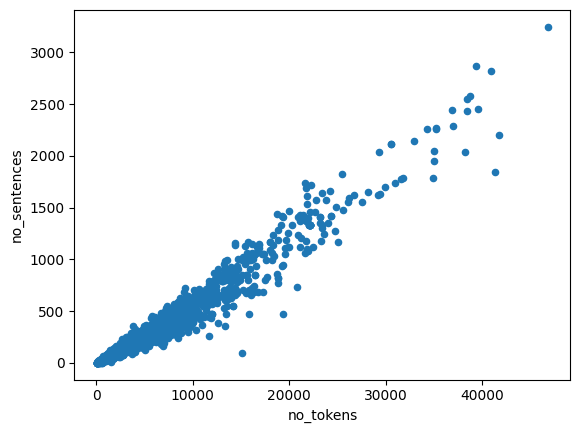

In [60]:
df.plot.scatter(x='no_tokens', y='no_sentences')

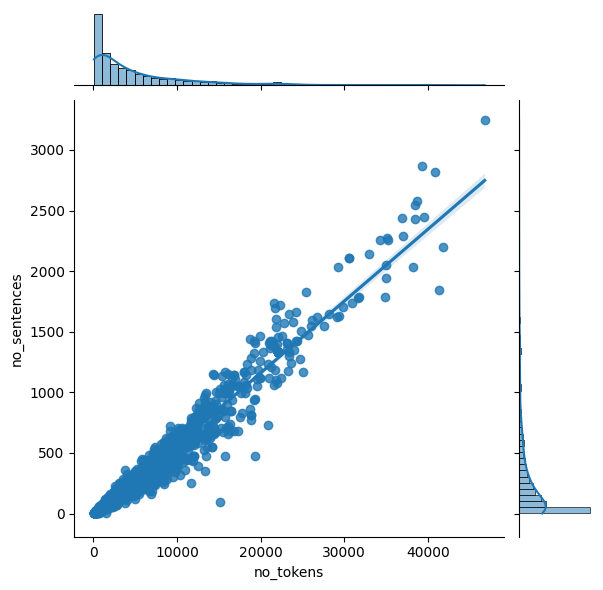

In [10]:
import seaborn as sns
sns.jointplot(x=df["no_tokens"], y=df["no_sentences"], kind="reg")

In [63]:
from collections import Counter

noun_chunks_counter = Counter(noun_chunks)
top_noun_chunks = noun_chunks_counter.most_common(50)

for chunk, frequency in top_noun_chunks:
    print(f"{chunk}: {frequency}")

the original: 28495
the company: 2515
the verge: 2267
the wayback machine: 1692
the use: 1639
the united states: 1598
the world: 1370
the number: 1280
the internet: 1280
the user: 1273
the original (pdf: 1271
new york: 1147
the end: 1129
the device: 1111
the new york times: 1092
the time: 1047
the system: 1007
the ability: 1007
a number: 989
the page: 960
a b: 916
the development: 892
this article: 870
the data: 782
the case: 735
the study: 732
ars technica: 716
the network: 706
a result: 689
the iphone: 676
the phone: 669
apple watch: 643
a set: 634
the field: 604
the guardian: 603
the database: 596
bbc news: 591
the wall street journal: 582
a series: 580
cambridge university press: 565
the term: 558
the camera: 556
the design: 553
computer science: 551
the name: 549
the process: 542
the history: 542
an example: 539
vox media: 539
the future: 536


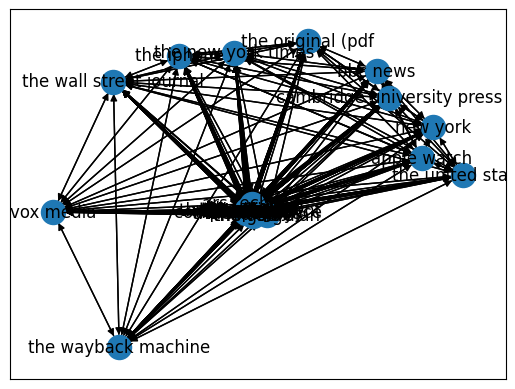

In [138]:
import networkx as nx

# create directed graph
G = nx.DiGraph()

# add nodes for each noun chunk
for chunk, frequency in top_noun_chunks:
    G.add_node(chunk)

# add edges with weights for co-occurring noun chunks
for i, (chunk1, freq1) in enumerate(top_noun_chunks):
    for j, (chunk2, freq2) in enumerate(top_noun_chunks):
        if i != j:
            cooccur_freq = 0
            for doc in df['noun_chunks']:
                if chunk1 in doc and chunk2 in doc:
                    cooccur_freq += 1
            G.add_edge(chunk1, chunk2, weight=cooccur_freq)

# visualize the graph
nx.draw_networkx(G)

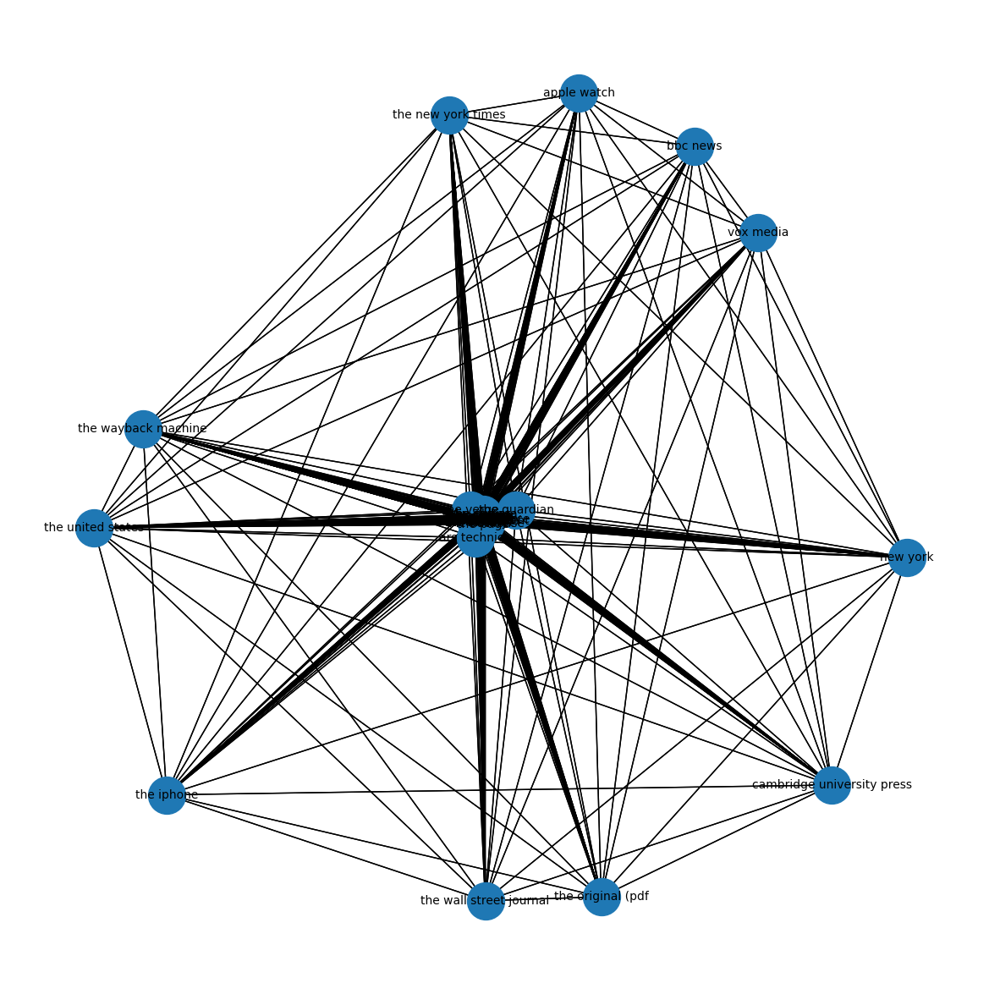

In [139]:
import matplotlib.pyplot as plt

# create layout using spring layout algorithm
pos = nx.spring_layout(G)

# create figure and adjust size
plt.figure(figsize=(15, 15))

# draw nodes and edges
nx.draw_networkx_nodes(G, pos, node_size=1000)
nx.draw_networkx_edges(G, pos, width=1)

# add labels for nodes
labels = {node: node for node in G.nodes()}
nx.draw_networkx_labels(G, pos, labels, font_size=10)

# show plot
plt.axis('off')
plt.show()

In [11]:
from collections import Counter
from spacy.lang.en.stop_words import STOP_WORDS

nouns = Counter(single_words(df, "nouns"))
for w in STOP_WORDS:
    nouns[w] = 0
    
voc = [w[0] for w in nouns.most_common(30000)]

In [12]:
from collections import defaultdict
from tqdm.auto import tqdm

c = defaultdict(lambda: Counter())

window = 9 # should be odd
skip = (window - 1) // 2
for doc in tqdm(df["nouns"]):
    # remove stop words
    tokens = [w for w in re.split(r'\||\#', doc) if w not in STOP_WORDS]
    for i, w in enumerate(tokens):
        if w in voc:
            for j in range(max(0, i-skip), i):
                if tokens[j] in voc:
                    c[w][tokens[j]] += 1
            for j in range(i+1, min(i+1+skip, len(tokens))):
                if tokens[j] in voc:
                    c[w][tokens[j]] += 1

/Users/muraliramravipati/Desktop/Nitin/venv/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
100%|██████████| 2107/2107 [09:14<00:00,  3.80it/s]


In [13]:
c["data"].most_common()

[('data', 5424),
 ('information', 740),
 ('network', 722),
 ('memory', 596),
 ('storage', 579),
 ('user', 569),
 ('system', 569),
 ('access', 552),
 ('original', 543),
 ('users', 529),
 ('computer', 516),
 ('time', 500),
 ('database', 497),
 ('systems', 418),
 ('devices', 404),
 ('software', 397),
 ('example', 397),
 ('analysis', 395),
 ('use', 395),
 ('applications', 382),
 ('security', 378),
 ('model', 374),
 ('mining', 365),
 ('processing', 362),
 ('rate', 352),
 ('device', 318),
 ('types', 315),
 ('services', 315),
 ('application', 310),
 ('number', 305),
 ('networks', 298),
 ('program', 296),
 ('service', 296),
 ('structure', 291),
 ('file', 276),
 ('structures', 271),
 ('company', 268),
 ('input', 263),
 ('code', 250),
 ('set', 249),
 ('rates', 243),
 ('process', 242),
 ('sets', 242),
 ('Internet', 238),
 ('web', 234),
 ('machine', 234),
 ('control', 234),
 ('technology', 231),
 ('language', 231),
 ('power', 231),
 ('type', 228),
 ('center', 226),
 ('collection', 225),
 ('methods

In [14]:
c["system"].most_common()

[('system', 2510),
 ('operating', 1902),
 ('systems', 718),
 ('software', 659),
 ('computer', 603),
 ('data', 569),
 ('original', 453),
 ('memory', 446),
 ('user', 430),
 ('time', 427),
 ('version', 423),
 ('file', 412),
 ('information', 384),
 ('users', 358),
 ('network', 356),
 ('security', 336),
 ('device', 326),
 ('use', 320),
 ('control', 316),
 ('devices', 307),
 ('hardware', 303),
 ('example', 302),
 ('applications', 301),
 ('design', 298),
 ('development', 293),
 ('article', 286),
 ('management', 272),
 ('performance', 264),
 ('language', 263),
 ('camera', 260),
 ('access', 253),
 ('code', 252),
 ('application', 243),
 ('number', 240),
 ('level', 230),
 ('support', 218),
 ('program', 206),
 ('components', 206),
 ('state', 204),
 ('storage', 204),
 ('requirements', 197),
 ('company', 197),
 ('source', 196),
 ('chip', 196),
 ('database', 190),
 ('interface', 187),
 ('process', 186),
 ('energy', 182),
 ('service', 181),
 ('space', 181),
 ('files', 180),
 ('features', 179),
 ('mode

In [15]:
import numpy as np
import re
from collections import defaultdict
from tqdm.auto import tqdm
from spacy.lang.en.stop_words import STOP_WORDS

word_cnts_in = defaultdict(lambda: Counter())
word_cnts_out = defaultdict(lambda: Counter())

window_size = 9
skip = (window_size - 1) // 2

for document in tqdm(df['nouns']):
    tokens = [w for w in re.split(r'\||\#', document) if w not in STOP_WORDS]
    for i, word in enumerate(tokens):
        if word in voc:
            for j in range(max(0, i - skip), i):
                if tokens[j] in voc:
                    word_cnts_in[word][tokens[j]] += 1
            for j in range(i + 1, min(i + 1 + skip, len(tokens))):
                if tokens[j] in voc:
                    word_cnts_out[word][tokens[j]] += 1



100%|██████████| 2107/2107 [09:01<00:00,  3.89it/s]


In [17]:
cooccurrence_matrix_in = np.zeros((len(voc), len(voc)))
cooccurrence_matrix_out = np.zeros((len(voc), len(voc)))

for i, word in enumerate(voc):
    for co_word, cnt in word_cnts_in[word].items():
        j = voc.index(co_word)
        cooccurrence_matrix_in[i, j] += cnt
    for co_word, cnt in word_cnts_out[word].items():
        j = voc.index(co_word)
        cooccurrence_matrix_out[i, j] += cnt

In [18]:
cooccurrence_matrix_in

array([[3.0229e+04, 2.7800e+02, 2.5800e+02, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       [2.6500e+02, 2.7120e+03, 3.0500e+02, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       [1.9500e+02, 2.6400e+02, 1.2550e+03, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       ...,
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 1.0000e+00, 1.0000e+00,
        0.0000e+00],
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 1.0000e+00, 0.0000e+00,
        0.0000e+00],
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]])

In [19]:
cooccurrence_matrix_out

array([[3.0229e+04, 2.6500e+02, 1.9500e+02, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       [2.7800e+02, 2.7120e+03, 2.6400e+02, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       [2.5800e+02, 3.0500e+02, 1.2550e+03, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       ...,
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 1.0000e+00, 1.0000e+00,
        0.0000e+00],
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 1.0000e+00, 0.0000e+00,
        0.0000e+00],
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]])

In [20]:
# Initialize authority and hub scores for each word to be 1
n = len(voc)
authority_scores = np.ones(n)
hub_scores = np.ones(n)

# Iterate until convergence or for a fixed number of iterations
max_iterations = 100
tolerance = 1e-6
for i in tqdm(range(max_iterations)):
    # Update authority scores
    new_authority_scores = cooccurrence_matrix_out.dot(hub_scores)
    new_authority_scores /= np.linalg.norm(new_authority_scores)
    
    # Update hub scores
    new_hub_scores = cooccurrence_matrix_in.dot(authority_scores)
    new_hub_scores /= np.linalg.norm(new_hub_scores)
    
    # Check convergence
    authority_diff = np.linalg.norm(new_authority_scores - authority_scores)
    hub_diff = np.linalg.norm(new_hub_scores - hub_scores)
    if authority_diff < tolerance and hub_diff < tolerance:
        break
    
    # Update scores for next iteration
    authority_scores = new_authority_scores
    
    hub_scores = new_hub_scores

# Rank words based on authority and hub scores
authority_ranking = np.argsort(-authority_scores)
hub_ranking = np.argsort(-hub_scores)


 11%|█         | 11/100 [00:33<04:28,  3.02s/it]


In [21]:
# Create dictionary to store HITS scores
hits_dict = {}
for i in range(n):
    word = voc[i]
    hits_dict[word] = {'authority': authority_scores[i], 'hub': hub_scores[i]}
    
# Print HITS scores for top 10 words by authority and hub
print("Top 10 words by authority score:")
for i in authority_ranking[:10]:
    word = voc[i]
    print(f"{word}: {hits_dict[word]['authority']:.10f}")

print("\nTop 10 words by hub score:")
for i in hub_ranking[:10]:
    word = voc[i]
    print(f"{word}: {hits_dict[word]['hub']:.10f}")

Top 10 words by authority score:
original: 0.9948166687
History: 0.0324952428
release: 0.0253566330
Apple: 0.0252468869
review: 0.0177079663
Verge: 0.0163062439
MacRumors: 0.0161038461
Press: 0.0138958115
Internet: 0.0134366892
data: 0.0128776237

Top 10 words by hub score:
original: 0.9951612778
History: 0.0279957890
Apple: 0.0262797377
release: 0.0201956409
review: 0.0195609731
web: 0.0166942928
Internet: 0.0135733933
phone: 0.0129831614
data: 0.0125537935
app: 0.0121643324


In [22]:
hub_ranking

array([    0,    69,   684, ..., 29468, 22776, 29933])

In [23]:
authority_ranking

array([    0,    69,    59, ..., 18174, 21332, 15991])

In [25]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/muraliramravipati/nltk_data...


True

In [26]:
import nltk
from nltk.corpus import wordnet as wn

# Use the top-k words as a proxy for the most important words
k = 30
top_words = [voc[i] for i in hub_ranking[:k]]

# Find the most semantically related words for each top word
semantic_dict = {}
for word in top_words:
    synsets = wn.synsets(word)
    if synsets:
        most_similar = synsets[0].lemmas()[0].name()
        semantic_dict[word] = most_similar

# Print the top words and their most semantically related words
for word, semantic_word in semantic_dict.items():
    print(f"{word} --> {semantic_word}")


original --> master
History --> history
Apple --> apple
release --> release
review --> reappraisal
web --> web
Internet --> internet
phone --> telephone
data --> data
users --> user
Press --> imperativeness
world --> universe
Web --> web
year --> year
Verge --> brink
version --> version
system --> system
Introduction --> introduction
software --> software
launch --> launch
video --> video
Office --> office
generation --> coevals
website --> web_site
media --> medium


In [27]:


# Create graph structure
graph = {}
for i, word in enumerate(voc):
    neighbors = []
    for j, co_word in enumerate(voc):
        if i != j:
            weight = authority_scores[j] * hub_scores[i]
            neighbors.append((j, weight))
    neighbors = sorted(neighbors, key=lambda x: x[1], reverse=True)[:10]
    graph[word] = neighbors


In [66]:
for word, neighbors in graph.items():
    print(f"{word}:")
    for neighbor in neighbors:
        print(f"\t{voc[neighbor[0]]} ({neighbor[1]:.10f})")


original:
	History (0.0323380073)
	release (0.0252339393)
	Apple (0.0251247242)
	review (0.0176222824)
	Verge (0.0162273425)
	MacRumors (0.0160259240)
	Press (0.0138285735)
	Internet (0.0133716728)
	data (0.0128153125)
	phone (0.0125102385)
data:
	original (0.0124887230)
	History (0.0004079386)
	release (0.0003183219)
	Apple (0.0003169442)
	review (0.0002223022)
	Verge (0.0002047052)
	MacRumors (0.0002021644)
	Press (0.0001744451)
	Internet (0.0001686814)
	phone (0.0001578146)
system:
	original (0.0092944245)
	History (0.0003035982)
	release (0.0002369033)
	Apple (0.0002358779)
	review (0.0001654429)
	Verge (0.0001523468)
	MacRumors (0.0001504558)
	Press (0.0001298265)
	Internet (0.0001255370)
	data (0.0001203137)
time:
	original (0.0070131926)
	History (0.0002290828)
	release (0.0001787575)
	Apple (0.0001779838)
	review (0.0001248364)
	Verge (0.0001149547)
	MacRumors (0.0001135278)
	Press (0.0000979618)
	Internet (0.0000947251)
	data (0.0000907838)
network:
	original (0.0061073732)
	H

In [29]:
import numpy as np
from nltk.corpus import wordnet as wn

def calc_PMI(w1, w2, in_matrix, out_matrix):
    # Step 1: Calculate the number of times w1 and w2 co-occur in the in co-occurrence matrix
    N_in = in_matrix[w1, w2]
    
    # Step 2: Calculate the number of times w1 and w2 co-occur in the out co-occurrence matrix
    N_out = out_matrix[w1, w2]
    
    # Step 3: Calculate the total number of co-occurrences of all words in the in co-occurrence matrix
    N_in_total = np.sum(in_matrix)
    
    # Step 4: Calculate the total number of co-occurrences of all words in the out co-occurrence matrix
    N_out_total = np.sum(out_matrix)
    
    # Step 5: Calculate the joint probability of w1 and w2 co-occurring together using both in and out matrices
    P_w1_w2 = (N_in + N_out) / (N_in_total + N_out_total)
    
    # Step 6: Calculate the individual probabilities of w1 and w2 using the respective matrix
    P_w1 = np.sum(in_matrix[w1]) / N_in_total
    P_w2 = np.sum(out_matrix[w2]) / N_out_total
    
    # Step 7: Calculate the PMI score for w1 and w2
    PMI = np.log2(P_w1_w2 / (P_w1 * P_w2))
    
    return PMI

In [35]:
# Find the most semantically related words for each top word
semantic_dict = {}
for word in top_words:
    synsets = wn.synsets(word)
    if synsets:
        most_similar = synsets[0].lemmas()[0].name()
        semantic_dict[word] = most_similar

# Calculate PMI for each pair of top words
pmi_scores = {}
for i in tqdm(range(k)):
    for j in range(i+1, k):
        word1 = top_words[i]
        word2 = top_words[j]
        pmi_score = calc_PMI(i, j, cooccurrence_matrix_in, cooccurrence_matrix_out)
        pmi_scores[(word1, word2)] = pmi_score

hits_related_words_dict={}
pmi_related_words_dict={}
# Compare top semantic words from HITS with words with high PMI scores
for word in tqdm(top_words):
    try:
        # HITS top 3 related words
        hits_related_words = list(sorted(graph[word], key=lambda x: x[1], reverse=True))[:10]
        hits_related_words = [voc[i[0]] for i in hits_related_words]
        print(f"HITS most related words for {word}: {hits_related_words}")
        hits_related_words_dict[word]=[hits_related_words]

        # PMI top 3 related words
        semantic_pmi_scores = []
        for other_word in top_words:
            if word != other_word:
                pmi_score = calc_PMI(voc.index(word), voc.index(other_word), cooccurrence_matrix_in, cooccurrence_matrix_out)
                semantic_pmi_scores.append((other_word, pmi_score))
        semantic_pmi_scores = sorted(semantic_pmi_scores, key=lambda x: x[1], reverse=True)
        print(f"Words with high PMI scores related to {word}: {[w[0] for w in semantic_pmi_scores[:10]]}")
        pmi_related_words_dict[word]=[w[0] for w in semantic_pmi_scores[:10]]

        
    except KeyError:
        continue

  0%|          | 0/30 [00:00<?, ?it/s]

HITS most related words for original: ['History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data', 'phone']


  3%|▎         | 1/30 [02:00<58:07, 120.27s/it]

Words with high PMI scores related to original: ['MacRumors', 'Apple', 'Office', 'Press', 'Forbes', 'Verge', 'review', 'maint', 'History', 'Introduction']
HITS most related words for History: ['original', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data', 'phone']


  7%|▋         | 2/30 [04:00<56:12, 120.44s/it]

Words with high PMI scores related to History: ['Introduction', 'original', 'maint', 'Forbes', 'Web', 'Internet', 'website', 'Office', 'Press', 'world']
HITS most related words for Apple: ['original', 'History', 'release', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data', 'phone']


/var/folders/2c/4l80zxg51wzb0ccbj2lp2sbw0000gn/T/ipykernel_2793/3955975088.py:25: RuntimeWarning: divide by zero encountered in log2
  PMI = np.log2(P_w1_w2 / (P_w1 * P_w2))
 10%|█         | 3/30 [06:01<54:10, 120.40s/it]

Words with high PMI scores related to Apple: ['MacRumors', 'original', 'Press', 'Verge', 'maint', 'Forbes', 'generation', 'review', 'release', 'apps']
HITS most related words for release: ['original', 'History', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data', 'phone']


 13%|█▎        | 4/30 [08:01<52:06, 120.25s/it]

Words with high PMI scores related to release: ['Press', 'version', 'Office', 'Apple', 'year', 'original', 'Verge', 'Forbes', 'phone', 'generation']
HITS most related words for review: ['original', 'History', 'release', 'Apple', 'Verge', 'MacRumors', 'Press', 'Internet', 'data', 'phone']


 17%|█▋        | 5/30 [10:02<50:16, 120.67s/it]

Words with high PMI scores related to review: ['Verge', 'original', 'MacRumors', 'Apple', 'phone', 'Forbes', 'Press', 'maint', 'website', 'Office']
HITS most related words for web: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data']


 20%|██        | 6/30 [12:05<48:34, 121.45s/it]

Words with high PMI scores related to web: ['maint', 'Web', 'Office', 'apps', 'website', 'app', 'Internet', 'users', 'Apple', 'software']
HITS most related words for Internet: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'data', 'phone']


 23%|██▎       | 7/30 [14:08<46:46, 122.00s/it]

Words with high PMI scores related to Internet: ['Web', 'users', 'Forbes', 'web', 'History', 'Introduction', 'media', 'Press', 'world', 'original']
HITS most related words for phone: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data']


 27%|██▋       | 8/30 [16:13<45:03, 122.87s/it]

Words with high PMI scores related to phone: ['review', 'Verge', 'apps', 'app', 'release', 'users', 'maint', 'launch', 'world', 'Press']
HITS most related words for data: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'phone']


 30%|███       | 9/30 [18:17<43:06, 123.16s/it]

Words with high PMI scores related to data: ['users', 'media', 'Internet', 'apps', 'web', 'website', 'software', 'system', 'app', 'world']
HITS most related words for app: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data']


 33%|███▎      | 10/30 [20:21<41:09, 123.46s/it]

Words with high PMI scores related to app: ['apps', 'Verge', 'users', 'website', 'web', 'video', 'Office', 'phone', 'version', 'Web']
HITS most related words for users: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data']


 37%|███▋      | 11/30 [22:24<39:04, 123.39s/it]

Words with high PMI scores related to users: ['app', 'apps', 'Internet', 'website', 'Verge', 'web', 'phone', 'media', 'video', 'Web']
HITS most related words for Press: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Internet', 'data', 'phone']


 40%|████      | 12/30 [24:10<35:24, 118.06s/it]

Words with high PMI scores related to Press: ['release', 'Apple', 'Forbes', 'original', 'MacRumors', 'Office', 'review', 'Verge', 'world', 'Web']
HITS most related words for MacRumors: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'Press', 'Internet', 'data', 'phone']


 43%|████▎     | 13/30 [25:43<31:17, 110.45s/it]

Words with high PMI scores related to MacRumors: ['Apple', 'Verge', 'original', 'Forbes', 'Press', 'review', 'generation', 'apps', 'release', 'History']
HITS most related words for maint: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data']


 47%|████▋     | 14/30 [27:19<28:17, 106.10s/it]

Words with high PMI scores related to maint: ['web', 'Apple', 'Office', 'Introduction', 'original', 'Web', 'History', 'Forbes', 'review', 'phone']
HITS most related words for world: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data']


 50%|█████     | 15/30 [28:46<25:04, 100.30s/it]

Words with high PMI scores related to world: ['Press', 'Verge', 'History', 'maint', 'Internet', 'year', 'phone', 'original', 'users', 'website']
HITS most related words for Web: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data']


 53%|█████▎    | 16/30 [30:17<22:47, 97.66s/it] 

Words with high PMI scores related to Web: ['Office', 'web', 'website', 'Internet', 'maint', 'original', 'History', 'apps', 'Press', 'app']
HITS most related words for year: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data']


 57%|█████▋    | 17/30 [31:44<20:26, 94.38s/it]

Words with high PMI scores related to year: ['release', 'launch', 'review', 'Verge', 'Office', 'original', 'world', 'Forbes', 'phone', 'version']
HITS most related words for apps: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data']


 60%|██████    | 18/30 [33:11<18:23, 91.99s/it]

Words with high PMI scores related to apps: ['app', 'Verge', 'Apple', 'web', 'Office', 'phone', 'users', 'Web', 'version', 'original']
HITS most related words for Verge: ['original', 'History', 'release', 'Apple', 'review', 'MacRumors', 'Press', 'Internet', 'data', 'phone']


 63%|██████▎   | 19/30 [34:37<16:33, 90.31s/it]

Words with high PMI scores related to Verge: ['MacRumors', 'Forbes', 'review', 'Apple', 'app', 'original', 'apps', 'phone', 'video', 'Press']
HITS most related words for version: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data']


 67%|██████▋   | 20/30 [36:04<14:51, 89.20s/it]

Words with high PMI scores related to version: ['Office', 'release', 'apps', 'app', 'generation', 'software', 'web', 'system', 'launch', 'year']
HITS most related words for system: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data']


 70%|███████   | 21/30 [37:30<13:15, 88.34s/it]

Words with high PMI scores related to system: ['software', 'version', 'launch', 'users', 'release', 'phone', 'data', 'world', 'apps', 'generation']
HITS most related words for Introduction: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data']


 73%|███████▎  | 22/30 [38:56<11:42, 87.82s/it]

Words with high PMI scores related to Introduction: ['History', 'maint', 'original', 'Forbes', 'Internet', 'Web', 'media', 'review', 'website', 'version']
HITS most related words for software: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data']


 77%|███████▋  | 23/30 [40:23<10:11, 87.39s/it]

Words with high PMI scores related to software: ['system', 'web', 'version', 'apps', 'video', 'users', 'Web', 'release', 'review', 'app']
HITS most related words for launch: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data']


 80%|████████  | 24/30 [41:49<08:42, 87.07s/it]

Words with high PMI scores related to launch: ['year', 'generation', 'release', 'original', 'phone', 'Press', 'maint', 'version', 'system', 'Forbes']
HITS most related words for video: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data']


 83%|████████▎ | 25/30 [43:15<07:13, 86.77s/it]

Words with high PMI scores related to video: ['Verge', 'app', 'media', 'users', 'review', 'website', 'software', 'phone', 'web', 'Forbes']
HITS most related words for Forbes: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data']


 87%|████████▋ | 26/30 [44:42<05:47, 86.77s/it]

Words with high PMI scores related to Forbes: ['Verge', 'Press', 'original', 'MacRumors', 'Apple', 'review', 'Introduction', 'History', 'website', 'Internet']
HITS most related words for Office: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data']


 90%|█████████ | 27/30 [46:08<04:19, 86.65s/it]

Words with high PMI scores related to Office: ['Web', 'original', 'version', 'maint', 'Press', 'web', 'release', 'apps', 'website', 'app']
HITS most related words for generation: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data']


 93%|█████████▎| 28/30 [47:35<02:53, 86.57s/it]

Words with high PMI scores related to generation: ['Apple', 'MacRumors', 'release', 'launch', 'version', 'phone', 'Forbes', 'review', 'media', 'video']
HITS most related words for website: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data']


 97%|█████████▋| 29/30 [49:01<01:26, 86.60s/it]

Words with high PMI scores related to website: ['media', 'Web', 'web', 'app', 'Office', 'Forbes', 'users', 'review', 'Press', 'original']
HITS most related words for media: ['original', 'History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data']


100%|██████████| 30/30 [50:29<00:00, 100.98s/it]

Words with high PMI scores related to media: ['website', 'Internet', 'users', 'video', 'Introduction', 'Web', 'review', 'app', 'History', 'Press']


In [48]:
p = pmi_related_words_dict
h=hits_related_words_dict


In [140]:
print(p)

{'original': ['MacRumors', 'Apple', 'Office', 'Press', 'Forbes', 'Verge', 'review', 'maint', 'History', 'Introduction'], 'History': ['Introduction', 'original', 'maint', 'Forbes', 'Web', 'Internet', 'website', 'Office', 'Press', 'world'], 'Apple': ['MacRumors', 'original', 'Press', 'Verge', 'maint', 'Forbes', 'generation', 'review', 'release', 'apps'], 'release': ['Press', 'version', 'Office', 'Apple', 'year', 'original', 'Verge', 'Forbes', 'phone', 'generation'], 'review': ['Verge', 'original', 'MacRumors', 'Apple', 'phone', 'Forbes', 'Press', 'maint', 'website', 'Office'], 'web': ['maint', 'Web', 'Office', 'apps', 'website', 'app', 'Internet', 'users', 'Apple', 'software'], 'Internet': ['Web', 'users', 'Forbes', 'web', 'History', 'Introduction', 'media', 'Press', 'world', 'original'], 'phone': ['review', 'Verge', 'apps', 'app', 'release', 'users', 'maint', 'launch', 'world', 'Press'], 'data': ['users', 'media', 'Internet', 'apps', 'web', 'website', 'software', 'system', 'app', 'world

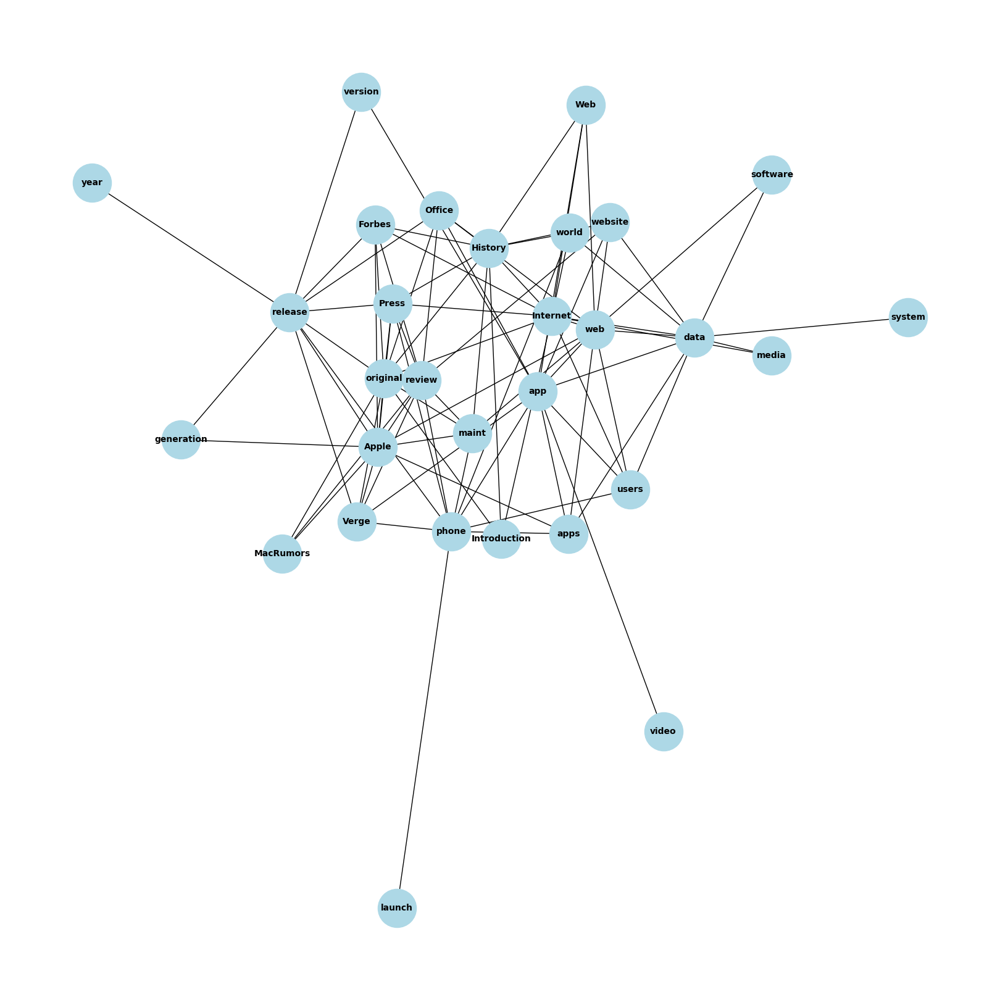

In [131]:
import networkx as nx
import matplotlib.pyplot as plt

#p is the dictionary of words and their associated words 
word_associations =p

# Create an empty graph
G = nx.Graph()
plt.figure(figsize=(16, 16))
# Add the words and their associated words as nodes and edges to the graph
c=0
for word, associations in word_associations.items():
    c=c+1
    if c>10:
        break
    G.add_node(word)
    for association in associations:
        G.add_edge(word, association)

# Draw the graph
nx.draw(G, with_labels=True, font_weight='bold',node_size=2000, node_color='lightblue',font_size=10, font_family='sans-serif')


# Show the graph
plt.show()

In [130]:
#just taking top 3 elemsts to represent the graph
H={'original': ['History', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data', 'phone'], 'History': ['original', 'release', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data', 'phone'], 'Apple': ['original', 'History', 'release', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data', 'phone'], 'release': ['original', 'History', 'Apple', 'review', 'Verge', 'MacRumors', 'Press', 'Internet', 'data', 'phone']}
P={'original': ['MacRumors', 'Apple', 'Office', 'Press', 'Forbes', 'Verge', 'review', 'maint', 'History', 'Introduction'], 'History': ['Introduction', 'original', 'maint', 'Forbes', 'Web', 'Internet', 'website', 'Office', 'Press', 'world'], 'Apple': ['MacRumors', 'original', 'Press', 'Verge', 'maint', 'Forbes', 'generation', 'review', 'release', 'apps'], 'release': ['Press', 'version', 'Office', 'Apple', 'year', 'original', 'Verge', 'Forbes', 'phone', 'generation']}

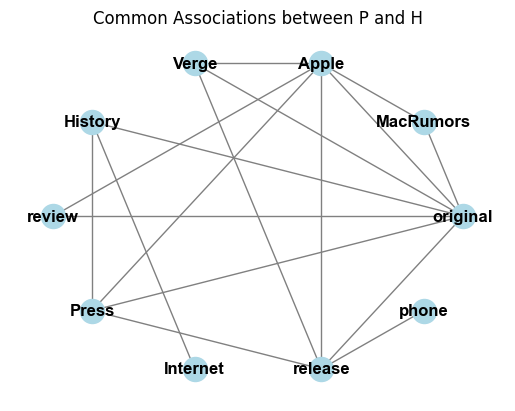

In [135]:
import networkx as nx
import matplotlib.pyplot as plt



# Create a graph
G = nx.Graph()

# Add nodes and edges for common associations
for word in P:
    if word in H:
        common_assoc = set(P[word]) & set(H[word])
        for assoc in common_assoc:
            G.add_edge(word, assoc)

# Set node positions using a circular layout
pos = nx.circular_layout(G)

# Draw nodes and edges
nx.draw_networkx_nodes(G, pos, node_color='lightblue')
nx.draw_networkx_edges(G, pos, edge_color='grey')

# Draw labels for nodes
nx.draw_networkx_labels(G, pos, font_size=12, font_family='Arial', font_weight='bold')

# Set axis and title
plt.axis('off')
plt.title('Common Associations between P and H')

# Show the plot
plt.show()